In [26]:
import matplotlib.pyplot as plt
from matplotlib.pylab import datestr2num
import pandas as pd
import numpy as np
from calendar import  mdays
import datetime as dt
import datetime
import seaborn as sns

In [27]:
from sklearn.preprocessing import MinMaxScaler

def data_normalisation(df):
    scaler=MinMaxScaler(feature_range=(0,1))
    
    for column_name in list(df.columns.values):
        if column_name == 'Date':
            continue
        the_list = df[column_name].tolist()
        the_list = np.array(the_list)
        the_list = scaler.fit_transform(the_list.reshape(-1,1))
        df.drop(column_name, axis = 1, inplace = True)
        df[column_name] = the_list
    return df

In [28]:
AAPL_df = pd.read_csv('../collected_df.csv', index_col = [0])
temp_df = data_normalisation(AAPL_df.copy())
temp_df['Date'] = pd.to_datetime(temp_df['Date'])
g = temp_df.groupby(pd.Grouper(key='Date', freq='M'))
dfs = [group for _,group in g]
deivided = len(g)//12
output_group = []
for i in range(deivided):
    for ii in range(12):
        if ii == 0:
            the_group=dfs[ii+12*i]
        else:
            the_group = the_group.append(dfs[ii+12*i])
    output_group.append(the_group)
output_month_group = {}
for i in range(deivided):
    for ii in range(12):
        if i==0 and ii==0:
            the_group = dfs[ii+12*i].sum()
            for thekey in the_group.keys():
#                 print(thekey)
#                 output_month_group[thekey] =the_group[thekey].tolist()
                the_list=[]
                the_list.append(the_group[thekey])
                output_month_group[thekey] = the_list
        else:
            the_value = dfs[ii+12*i].sum()
            for thekey in the_group.keys():
#                 print(output_month_group[thekey],the_value[thekey])
                output_month_group[thekey].append(the_value[thekey])
#                 the_group[thekey] = np.append(the_group[thekey],the_value[thekey])

C:\Users\13862\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
C:\Users\13862\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


In [12]:
list_thedates=[]
for i in range(deivided):
    for ii in range(12):
        theyear = 2015 +i
        theyear = str(theyear)
        themonth=(ii)%12
        themonth=str(themonth)
        thedatetime = theyear+'-'+themonth
#         thedatetime = datetime.datetime.strptime((theyear+themonth), "%Y%m").date()
        list_thedates.append(thedatetime)
print(list_thedates)
df = pd.DataFrame(data=output_month_group)
df.index=list_thedates
df

['2015-0', '2015-1', '2015-2', '2015-3', '2015-4', '2015-5', '2015-6', '2015-7', '2015-8', '2015-9', '2015-10', '2015-11', '2016-0', '2016-1', '2016-2', '2016-3', '2016-4', '2016-5', '2016-6', '2016-7', '2016-8', '2016-9', '2016-10', '2016-11', '2017-0', '2017-1', '2017-2', '2017-3', '2017-4', '2017-5', '2017-6', '2017-7', '2017-8', '2017-9', '2017-10', '2017-11', '2018-0', '2018-1', '2018-2', '2018-3', '2018-4', '2018-5', '2018-6', '2018-7', '2018-8', '2018-9', '2018-10', '2018-11', '2019-0', '2019-1', '2019-2', '2019-3', '2019-4', '2019-5', '2019-6', '2019-7', '2019-8', '2019-9', '2019-10', '2019-11', '2020-0', '2020-1', '2020-2', '2020-3', '2020-4', '2020-5', '2020-6', '2020-7', '2020-8', '2020-9', '2020-10', '2020-11', '2021-0', '2021-1', '2021-2', '2021-3', '2021-4', '2021-5', '2021-6', '2021-7', '2021-8', '2021-9', '2021-10', '2021-11', '2022-0', '2022-1', '2022-2', '2022-3', '2022-4', '2022-5', '2022-6', '2022-7', '2022-8', '2022-9', '2022-10', '2022-11']


,Close,^DJI_Close,^IXIC_Close,^GSPC_Close,^RLG_Close,^NYA_Close,DX-Y.NYB_Close,EURUSD=X_Close,GBPUSD=X_Close,GC=F_Close,...,GACDFSA066MSFRBPHI,GACDISA066MSFRBNY,BACTSAMFRBDAL,IR,IQ,PPIACO,CPIAUCSL,CPILFESL,MICH,CSCICP03USM665S
2015-0,0.636710,1.780627,0.690146,1.341870,0.584972,4.435133,3.438090,14.045777,17.205316,4.039671,...,13.951311,14.966997,12.522202,5.623003,3.292181,2.162687,0.000000,0.000000,2.424242,18.217943
2015-1,1.045554,2.053950,0.946593,1.620635,0.876260,4.857365,4.368731,11.455213,16.889312,3.305785,...,12.720037,13.920792,10.428064,5.038339,3.049383,1.881739,0.175972,0.111259,4.030303,17.315082
2015-2,1.229230,2.364035,1.252333,1.860174,1.108308,5.490718,8.007056,9.434861,18.211550,2.791345,...,14.089888,14.866337,11.253996,5.693291,3.530864,2.267789,0.420871,0.336875,6.000000,19.656549
2015-3,1.216842,2.295091,1.280795,1.880869,1.134535,5.673880,7.407525,8.626368,17.163632,3.127410,...,13.862360,13.566832,10.873002,5.300319,3.024691,2.037372,0.482154,0.522880,3.181818,18.550671
2015-4,1.205002,2.331689,1.293559,1.906423,1.132165,5.521817,5.173984,10.833526,18.373712,2.946237,...,12.546816,13.547855,9.964476,5.942492,3.127572,2.445655,0.701711,0.608931,4.242424,17.370274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-7,20.817972,18.876343,16.197536,18.055087,16.571359,17.756749,16.726881,4.197710,5.647306,16.357150,...,14.536517,8.900165,12.439609,20.134185,19.024691,20.511748,21.686083,21.201382,18.818182,1.098069
2022-8,17.179081,14.890487,12.709803,14.305151,13.117312,13.806800,18.229624,2.274382,2.497675,13.174877,...,10.598315,13.289604,10.518650,17.376997,16.722222,18.378369,20.198808,19.936868,16.545455,1.808014
2022-9,16.126675,14.812131,11.638741,13.424316,12.191122,13.012236,19.215517,1.755004,2.323045,12.906765,...,10.637640,11.972772,10.145648,17.108626,16.376543,17.776283,20.672135,20.275463,18.454545,2.189901
2022-10,16.236005,17.640621,11.945343,14.779065,12.718502,15.612556,16.087383,4.167753,3.992594,14.170281,...,8.985955,14.329208,11.059503,16.370607,16.117284,17.383877,20.871862,20.591575,17.818182,2.376830


<AxesSubplot:>

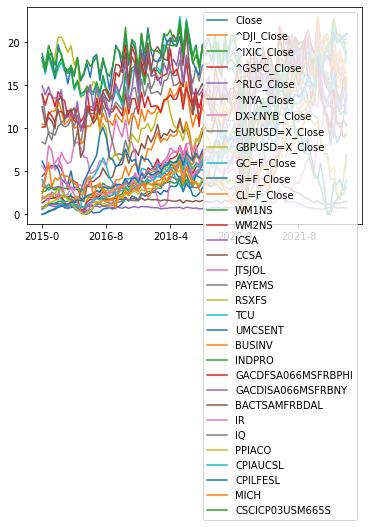

In [13]:
df.plot()

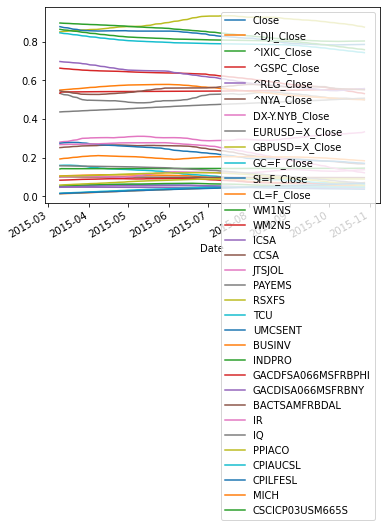

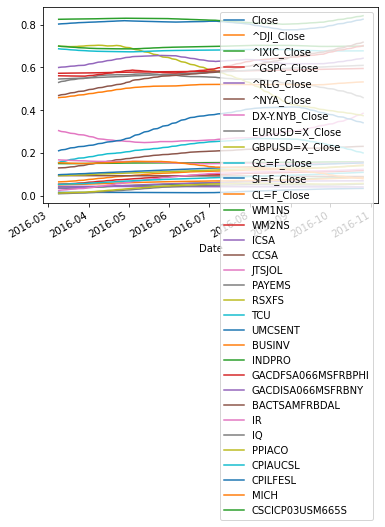

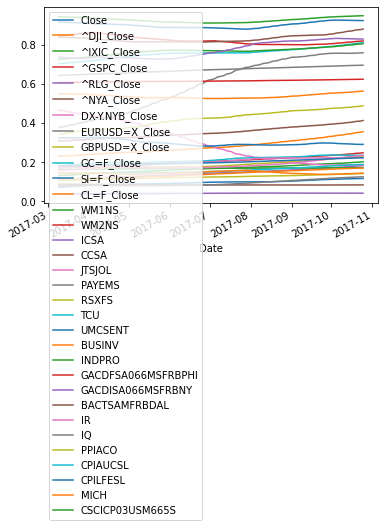

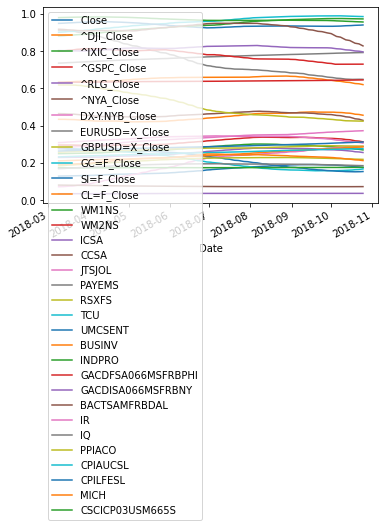

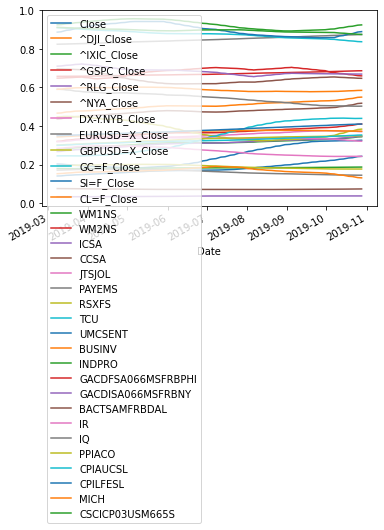

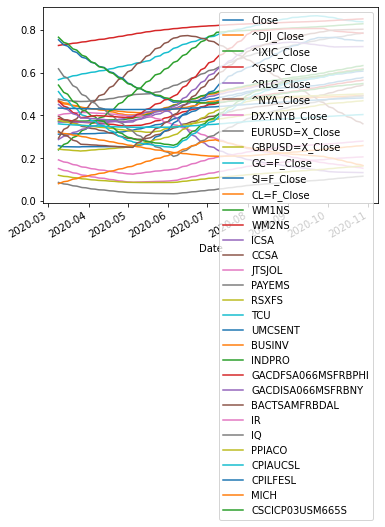

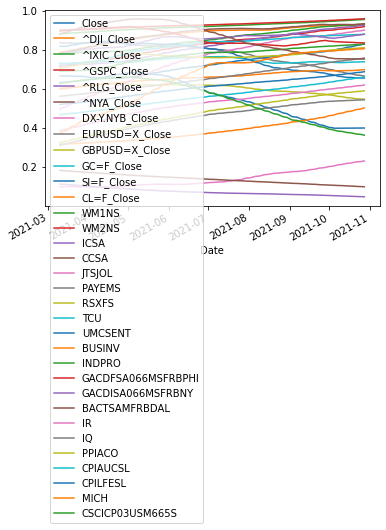

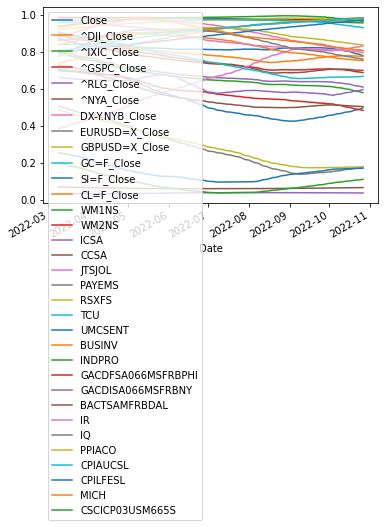

In [14]:
for item in output_group:
#     item['Date'] = pd.to_datetime(item['Date'])
    # Set the column 'Date' as index (skip if already done)
#     item = item.set_index('Date')
    seasonal_cycle = item.rolling(window=90, center=True).mean().groupby(item['Date']).mean()
    seasonal_cycle.plot()
    plt.show()


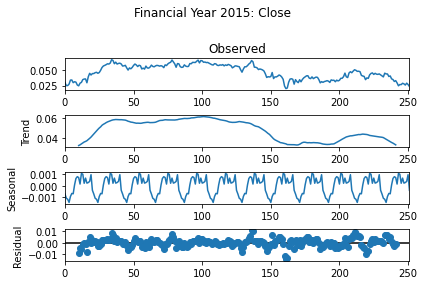

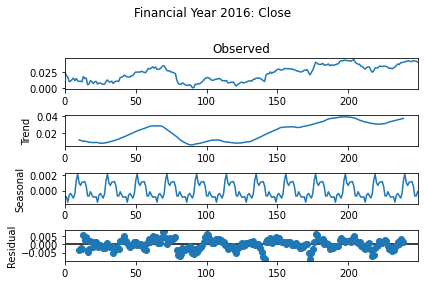

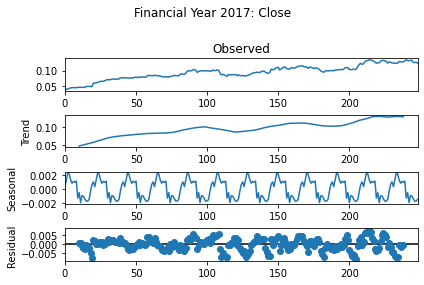

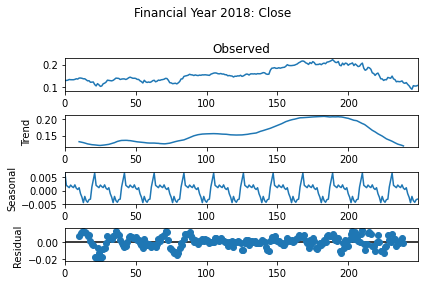

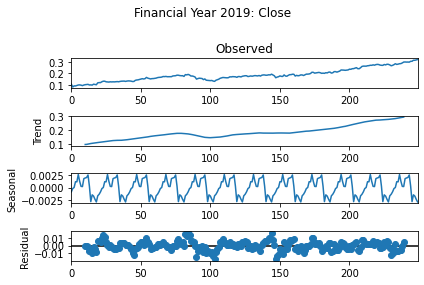

...

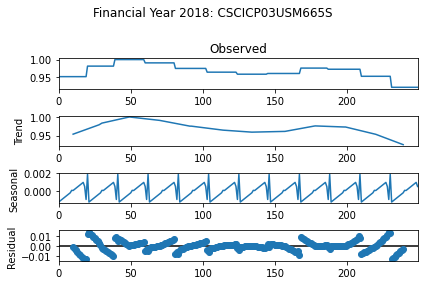

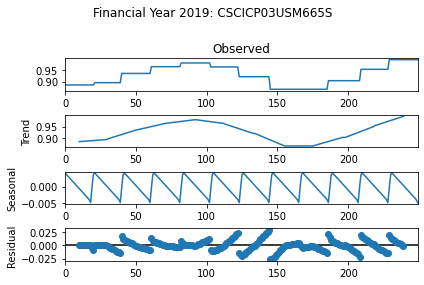

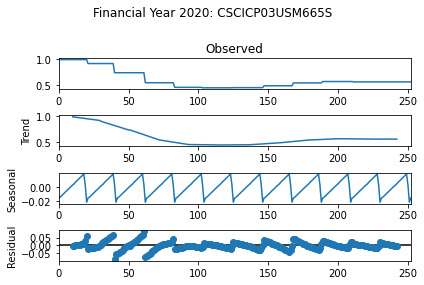

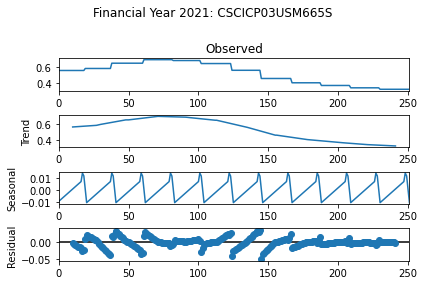

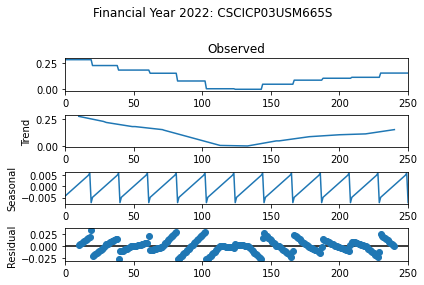

In [16]:
import statsmodels.api as sm
the_names= df.columns.tolist()
for thekey in the_names:   
    for i,item in enumerate(output_group):
        the_title = i+2015
        the_title = "Financial Year " + str(the_title) + ': ' + str(thekey)
        item.sort_index(inplace= True)
        res = sm.tsa.seasonal_decompose(np.asarray(item[thekey]), period=21, model='additive')
        res.plot()
        plt.suptitle(the_title)
        plt.subplots_adjust(top=0.8)
        plt.show()
#     decomposition = sm.tsa.seasonal_decompose(df.Close, model='additive')
#     decomposition

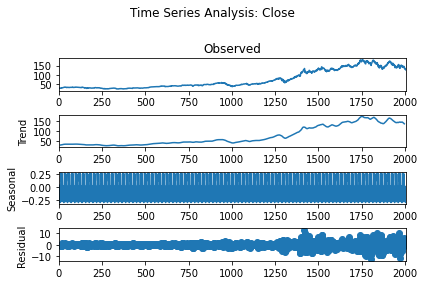

In [17]:
thekey = 'Close'
the_title = "Time Series Analysis" +  ': ' + str(thekey)
res = sm.tsa.seasonal_decompose(np.asarray(AAPL_df[thekey]),period=21, model='additive')
# res = sm.tsa.seasonal_decompose(np.asarray(AAPL_df[thekey]),period=21, model='multiplicative')
res.plot()
plt.suptitle(the_title)
plt.subplots_adjust(top=0.8)
plt.savefig('MUL_Time_Series_Analysis.png')
plt.show()

### Feature Correlation

                    Close  ^DJI_Close  ^IXIC_Close  ^GSPC_Close  ^RLG_Close  \
Close                1.00        0.92         0.96         0.96        0.97   
^DJI_Close           0.92        1.00         0.96         0.98        0.96   
^IXIC_Close          0.96        0.96         1.00         0.99        1.00   
^GSPC_Close          0.96        0.98         0.99         1.00        0.99   
^RLG_Close           0.97        0.96         1.00         0.99        1.00   
^NYA_Close           0.90        0.97         0.94         0.97        0.94   
DX-Y.NYB_Close       0.17        0.04        -0.03         0.06        0.01   
EURUSD=X_Close      -0.03        0.13         0.17         0.09        0.13   
GBPUSD=X_Close      -0.31       -0.40        -0.28        -0.33       -0.30   
GC=F_Close           0.91        0.84         0.90         0.88        0.91   
SI=F_Close           0.80        0.72         0.82         0.78        0.81   
CL=F_Close           0.64        0.67         0.57  

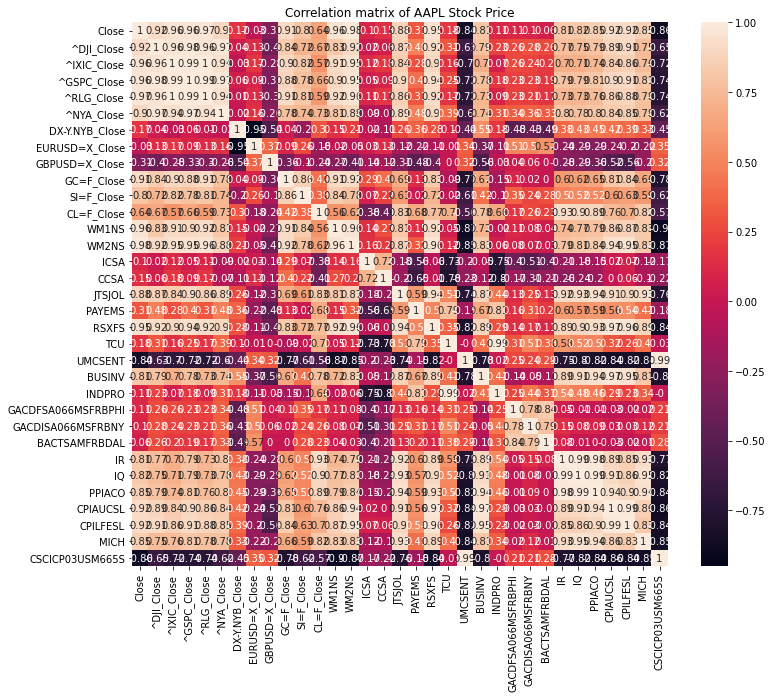

In [20]:
the_names= df.columns.tolist()
# x = AAPL_df['Close']
cor_AAPL_df = AAPL_df[the_names]
# Covariance = np.cov(x, y)
Covariance = cor_AAPL_df.corr()
Covariance = Covariance.round(decimals=2, out=None)
print(Covariance)
fig, ax = plt.subplots(figsize=(12,10)) 
sns.heatmap(Covariance, annot=True, fmt='g')
plt.title("Correlation matrix of AAPL Stock Price")
plt.savefig('Correlation_matrix_of_AAPL_Stock_Price.png')
plt.show()

### Feature hypothesis

In [21]:
diffs = AAPL_df['Close'].diff()
print(len(AAPL_df['Close']))
temp_df = AAPL_df.copy()
temp_df = temp_df.assign(Change=np.where(diffs > 0, 1, np.where(diffs < 0, 0, '------')))
temp_df

2007


,Date,Close,^DJI_Close,^IXIC_Close,^GSPC_Close,^RLG_Close,^NYA_Close,DX-Y.NYB_Close,EURUSD=X_Close,GBPUSD=X_Close,...,GACDISA066MSFRBNY,BACTSAMFRBDAL,IR,IQ,PPIACO,CPIAUCSL,CPILFESL,MICH,CSCICP03USM665S,Change
0,2015-01-02,27.332500,17832.990234,4726.810059,2058.199951,960.280029,10830.919922,91.080002,1.208941,1.557972,...,12.5,-4.5,126.0,126.1,192.000,234.747,239.811,2.5,101.143074,------
1,2015-01-05,26.562500,17501.650391,4652.569824,2020.579956,943.780029,10607.679688,91.379997,1.194643,1.528491,...,12.5,-4.5,126.0,126.1,192.000,234.747,239.811,2.5,101.143074,0
2,2015-01-06,26.565001,17371.640625,4592.740234,2002.609985,935.020020,10514.870117,91.500000,1.193902,1.525832,...,12.5,-4.5,126.0,126.1,192.000,234.747,239.811,2.5,101.143074,1
3,2015-01-07,26.937500,17584.519531,4650.470215,2025.900024,946.880005,10627.129883,91.889999,1.187536,1.513798,...,12.5,-4.5,126.0,126.1,192.000,234.747,239.811,2.5,101.143074,1
4,2015-01-08,27.972500,17907.869141,4736.189941,2062.139893,964.159973,10800.540039,92.370003,1.183600,1.510757,...,12.5,-4.5,126.0,126.1,192.000,234.747,239.811,2.5,101.143074,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2002,2022-12-23,131.860001,33203.929688,10497.860352,3844.820068,2165.620117,15188.450195,104.309998,1.060333,1.203992,...,-11.2,-20.0,141.8,150.7,258.012,298.990,301.460,4.4,96.919411,0
2003,2022-12-27,130.029999,33241.558594,10353.230469,3829.250000,2144.899902,15218.259766,104.180000,1.064022,1.208415,...,-11.2,-20.0,141.8,150.7,258.012,298.990,301.460,4.4,96.919411,0
2004,2022-12-28,126.040001,32875.710938,10213.290039,3783.219971,2117.199951,15037.320312,104.459999,1.063717,1.202733,...,-11.2,-20.0,141.8,150.7,258.012,298.990,301.460,4.4,96.919411,0
2005,2022-12-29,129.610001,33220.800781,10478.089844,3849.280029,2163.790039,15241.209961,103.839996,1.062925,1.202848,...,-11.2,-20.0,141.8,150.7,258.012,298.990,301.460,4.4,96.919411,1


In [22]:
def append_diff_df(df,thekeys):
    for key in thekeys:
        the_diffs = df[key].diff()
        str_key = key.split('_')
        str_key = str_key[0] + '_Change'        
        df = df.assign(temp_change=np.where(the_diffs > 0, 1, np.where(the_diffs < 0, 0, 0)))
        df = df.rename(columns={"temp_change": str_key})
        df[str_key] = df[str_key].astype(int) 
    return df

In [23]:
def positive_negative_information(AAPL_df):
    mean_dic={}
    min_dic={}
    for item in AAPL_df.columns:
        if item == 'Date':
            continue
        mean_dic[item] = AAPL_df[item].mean()
        min_dic[item] = AAPL_df[item].min()
        
    diffs = AAPL_df['Close'].diff()
    temp_df = AAPL_df.copy()
    temp_df = temp_df.assign(Change=np.where(diffs > 0, 1, np.where(diffs < 0, 0, 0)))
    temp_df['Change'] = temp_df['Change'].astype(int) 
    increase_no = len(temp_df[temp_df['Change'] == 1])
    decline_no = len(temp_df[temp_df['Change'] == 0])

    need_diff = ['VIX_Close','Oil_Close','Gold_Close','Silver_Close','Dollar_Index_Close','GBP_Close','CNY_Close','EUR_Close','NASDAQ_Close',
                   'DJIA_Close','NYA_Close','RLG_Close','SPX_Close']
    temp_df = append_diff_df(temp_df,need_diff)
    print(temp_df)
   
    positve_disaster_no = len(temp_df[(temp_df['Disaster_Affected']> min_dic['Disaster_Affected'] ) & (temp_df['Change'] == 1)])
    negative_disaster_no = len(temp_df[(temp_df['Disaster_Affected']> min_dic['Disaster_Affected'] ) & (temp_df['Change'] == 0)])
    positve_not_disaster_no = len(temp_df[(temp_df['Disaster_Affected']<= min_dic['Disaster_Affected'] ) & (temp_df['Change'] == 1)])
    negative_not_disaster_no = len(temp_df[(temp_df['Disaster_Affected']<= min_dic['Disaster_Affected'] ) & (temp_df['Change'] == 0)])
    
    positve_good_carbon_no = len(temp_df[(temp_df['Carbon_Smoothed']> mean_dic['Carbon_Smoothed'] ) & (temp_df['Change'] == 1)])
    negative_good_carbon_no = len(temp_df[(temp_df['Carbon_Smoothed']> mean_dic['Carbon_Smoothed'] ) & (temp_df['Change'] == 0)])
    positve_bad_carbon_no = len(temp_df[(temp_df['Carbon_Smoothed']<= mean_dic['Carbon_Smoothed'] ) & (temp_df['Change'] == 1)])
    negative_bad_carbon_no = len(temp_df[(temp_df['Carbon_Smoothed']<= mean_dic['Carbon_Smoothed'] ) & (temp_df['Change'] == 0)])
    
    positve_good_air_no = len(temp_df[(temp_df['AQI']> mean_dic['AQI'] ) & (temp_df['Change'] == 1)])
    negative_good_air_no = len(temp_df[(temp_df['AQI']> mean_dic['AQI'] ) & (temp_df['Change'] == 0)])
    positve_bad_air_no = len(temp_df[(temp_df['AQI']<= mean_dic['AQI'] ) & (temp_df['Change'] == 1)])
    negative_bad_air_no = len(temp_df[(temp_df['AQI']<= mean_dic['AQI'] ) & (temp_df['Change'] == 0)])
    
    positve_good_covid_no = len(temp_df[(temp_df['Covid_Index']> mean_dic['Covid_Index'] ) & (temp_df['Change'] == 1)])
    negative_good_covid_no = len(temp_df[(temp_df['Covid_Index']> mean_dic['Covid_Index'] ) & (temp_df['Change'] == 0)])
    positve_bad_covid_no = len(temp_df[(temp_df['Covid_Index']<= mean_dic['Covid_Index'] ) & (temp_df['Change'] == 1)])
    negative_bad_covid_no = len(temp_df[(temp_df['Covid_Index']<= mean_dic['Covid_Index'] ) & (temp_df['Change'] == 0)])
    
    positve_good_news = len(temp_df[(temp_df['News_Score']> mean_dic['News_Score'] ) & (temp_df['Change'] == 1)])
    negative_good_news = len(temp_df[(temp_df['News_Score']> mean_dic['News_Score'] ) & (temp_df['Change'] == 0)])
    positve_bad_news = len(temp_df[(temp_df['News_Score']<= mean_dic['News_Score'] ) & (temp_df['Change'] == 1)])
    negative_bad_news = len(temp_df[(temp_df['News_Score']<= mean_dic['News_Score'] ) & (temp_df['Change'] == 0)])
    
    positve_good_twitters = len(temp_df[(temp_df['Twitter_Score']> mean_dic['Twitter_Score'] ) & (temp_df['Change'] == 1)])
    negative_good_twitters = len(temp_df[(temp_df['Twitter_Score']> mean_dic['Twitter_Score'] ) & (temp_df['Change'] == 0)])
    positve_bad_twitters = len(temp_df[(temp_df['Twitter_Score']<= mean_dic['Twitter_Score'] ) & (temp_df['Change'] == 1)])
    negative_bad_twitters = len(temp_df[(temp_df['Twitter_Score']<= mean_dic['Twitter_Score'] ) & (temp_df['Change'] == 0)])
    
    positve_good_reports = len(temp_df[(temp_df['Report_Score']> mean_dic['Report_Score'] ) & (temp_df['Change'] == 1)])
    negative_good_reports = len(temp_df[(temp_df['Report_Score']> mean_dic['Report_Score'] ) & (temp_df['Change'] == 0)])
    positve_bad_reports = len(temp_df[(temp_df['Report_Score']<= mean_dic['Report_Score'] ) & (temp_df['Change'] == 1)])
    negative_bad_reports = len(temp_df[(temp_df['Report_Score']<= mean_dic['Report_Score'] ) & (temp_df['Change'] == 0)])
    
    res_values = []
    for item in need_diff:
        str_key = item.split('_')
        str_key = str_key[0] + '_Change'  
        positve_increase_temp_Close = len(temp_df[(temp_df[str_key]==1 ) & (temp_df['Change'] == 1)])
        negative_increase_temp_Close = len(temp_df[(temp_df[str_key]==1 ) & (temp_df['Change'] == 0)])
        positve_decline_temp_Close = len(temp_df[(temp_df[str_key]==0 ) & (temp_df['Change'] == 1)])
        negative_decline_temp_Close = len(temp_df[(temp_df[str_key]==0 ) & (temp_df['Change'] == 0)])
        res_values.append([positve_increase_temp_Close, negative_increase_temp_Close, positve_decline_temp_Close,
                          negative_decline_temp_Close])
    
       
    list_disaster_no =[positve_disaster_no, negative_disaster_no, positve_disaster_no + negative_disaster_no]
    list_not_disaster_no =[positve_not_disaster_no, negative_not_disaster_no, positve_not_disaster_no + negative_not_disaster_no]
    
    list_good_carbon_no =[positve_good_carbon_no, negative_good_carbon_no, positve_good_carbon_no + negative_good_carbon_no]
    list_bad_carbon_no =[positve_bad_carbon_no, negative_bad_carbon_no, positve_bad_carbon_no + negative_bad_carbon_no]
    
    list_good_air_no =[positve_good_air_no, negative_good_air_no, positve_good_air_no + negative_good_air_no]
    list_bad_air_no =[positve_bad_air_no, negative_bad_air_no, positve_bad_air_no + negative_bad_air_no]
    
    list_good_covid_no =[positve_good_covid_no, negative_good_covid_no, positve_good_covid_no + negative_good_covid_no]
    list_bad_covid_no =[positve_bad_covid_no, negative_bad_covid_no, positve_bad_covid_no + negative_bad_covid_no]
    
    list_good_news =[positve_good_news, negative_good_news, positve_good_news + negative_good_news]
    list_bad_news =[positve_bad_news, negative_bad_news, positve_bad_news + negative_bad_news]
    
    list_good_twitters =[positve_good_twitters, negative_good_twitters, positve_good_twitters + negative_good_twitters]
    list_bad_twitters =[positve_bad_twitters, negative_bad_twitters, positve_bad_twitters + negative_bad_twitters]
    
    list_good_reports =[positve_good_reports, negative_good_reports, positve_good_reports + negative_good_reports]
    list_bad_reports =[positve_bad_reports, negative_bad_reports, positve_bad_reports + negative_bad_reports]
    
    res_dic={}
    for i, item in enumerate(need_diff):
        str_key = item.split('_')
        increase_str_key = 'Increase_'+str_key[0] + '_days'
        decline_str_key = 'Increase_'+str_key[0] + '_days'
        list_increase_VIX_Close =[res_values[i][0], res_values[i][1], res_values[i][0]+ res_values[i][1]]
        list_decline_VIX_Close =[res_values[i][2], res_values[i][3], res_values[i][2]+ res_values[i][3]]
        res_dic[increase_str_key] = list_increase_VIX_Close
        res_dic[decline_str_key] = list_decline_VIX_Close
    
    list_total = [increase_no, decline_no, increase_no + decline_no]
    
#     d = {'Disaster_days': list_disaster_no, 'Good_Carbon_days': list_good_carbon_no, 'Good_Air_days': list_good_air_no,
#          'Good_News_days': list_good_news, 'Good_Twitters_days': list_good_twitters,'Good_Reports_days': list_good_reports,
#          'Increase_VIX_days': list_increase_VIX_Close,'Total': list_total }
    d = {'Disaster_days': list_disaster_no, 'Good_Carbon_days': list_good_carbon_no, 'Bad_Carbon_days': list_bad_carbon_no,
         'Good_Air_days': list_good_air_no, 'Bad_Air_days': list_bad_air_no,'Good_Covid_days': list_good_covid_no, 
         'Bad_Covid_days': list_bad_covid_no, 'Good_News_days': list_good_news,'Bad_News_days': list_bad_news, 
         'Good_Twitters_days': list_good_twitters, 'Bad_Twitters_days': list_bad_twitters,
         'Good_Reports_days': list_good_reports, 'Bad_Reports_days': list_bad_reports,'Increase_VIX_days': list_increase_VIX_Close,
         'Decline_VIX_days': list_decline_VIX_Close}
    d.update(res_dic)
    d['Total']= list_total
    
    index = ['Increase_Days','Decline_days', 'Total']
    Table_with_Total = pd.DataFrame(data=d,index=index)
    
    return Table_with_Total
#     print(positve_disaster_no,negative_disaster_no,positve_not_disaster_no,negative_not_disaster_no  )

In [24]:
test_df = positive_negative_information(AAPL_df)
test_df.to_csv('ctable.csv')


KeyError: 'VIX_Close'

In [25]:
from scipy.stats import chi2_contingency
from scipy.stats import chi2

stat, p, dof, expected = chi2_contingency(test_df)
print("statistic",stat)
print("p-value",p)
print("degres of fredom: ",dof)
print("table of expected frequencies\n",expected)

prob = 0.90
critical = chi2.ppf(prob, dof)
print(critical)
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

NameError: name 'test_df' is not defined